### *CVL867 Assignment 02*
*Submitted by: Aman Pawar*

*Importing the necessary Libraries*

In [1]:
# importing the necessary libraries
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import animation

# Necessary functionalities that will help in plotting and animination
%matplotlib notebook
plt.rcParams["animation.html"] = "jshtml"
mpl.rcParams['animation.embed_limit'] = 5 # Setting the limit of matplotlib animations to 5 mb
# Note the rendered output will not be of the entire duration because I have given less size per animination


# kindly uncomment the below lines if you are not sure of the dependencies present
"""
!pip install numpy as np # to work with numpy arrays
!pip install matplotlib.pyplot as plt # FOr graphical visualizations
"""

# For the purpose of reproduciblity of results
seed_value = 1496
np.random.seed(seed_value)

*Answer : 01*
<br/>
*Part - I Function to implement 1D random walk*

In [2]:
# Answer 01
# Algorithm to run a 1D random walk with 1000 jumps

def random_walk_1D(num_steps, hops=1):

    """
    This function generates ransdom walk in 1 D
    args:
        Inputs:
        num_steps : int num_steps for which you want the random walk 
        hops : int (value of 1 hop in eg: 1 means it jumps 1 place)
        outputs: array of the positions of a partical with num_steps 
    """

    sequence_of_traj = []
    list_choice =["right", "left"]
    for _ in range(num_steps):
        temp_num = np.random.choice(list_choice)
        if temp_num =="left":
            sequence_of_traj.append(-1*hops)
        else:
            sequence_of_traj.append(1*hops)

    # initilising an empty list to store the positions
    val = []
    x=0

    # iterating over the sequence of trajectories
    for i in sequence_of_traj:

        x+=i
        val.append(x)

    val = np.array(val)
    
    return val


def plot(traj):
    """
    Function for plotting the random walk
    args:
        Inputs: traj (input trajectory of the random walk)
        outputs: 
    """

    fig, ax = plt.subplots(figsize=(10,3))
    xdata, ydata = [], []
    ln, = plt.plot([], [], '--or',label="Current position", animated=True)
    lb, = plt.plot([], [], '--ob', label="Previous position", animated=True)
    lz, = plt.plot([], [], '--og',label="Squared position", animated=True)
    
    def init():
        ax.set_yticklabels([])
        ax.set_xlim(-100, 100)
        ax.set_ylim(0, 1)
        return ln,lb, lz
    
    def animate(frame):
        x = frame
        y = traj[frame]
        xdata.append(x)
        ydata.append(y)
        ln.set_data(ydata[-1], 0.5,)
        lz.set_data(ydata[-1]**2, 0.5,)
        try:
            lb.set_data(ydata[-2], 0.5,)
        except:
            pass
        return ln,lb, lz

    anim = animation.FuncAnimation(fig, animate, init_func=init, frames=len(traj), interval=100, blit=True)
    
    plt.tight_layout()
    plt.plot(traj, np.array([0.5]*len(traj)), '--g', alpha=0.5, animated=False, label="Path of Random Walk")
    plt.title("Random Walk in 1D")
    plt.xlabel("Position of the pointer")
    plt.legend()
    plt.show()
    return anim


In [3]:
# Plotting the animation of the 1 D random walk
plot(random_walk_1D(1000, hops=1))

<IPython.core.display.Javascript object>

*Part - II : Plotting x and x^2 with respect to step number*

Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py", line 196, in process
    func(*args, **kwargs)
  File "/usr/local/lib/python3.8/dist-packages/matplotlib/animation.py", line 1467, in _stop
    self.event_source.remove_callback(self._loop_delay)
AttributeError: 'NoneType' object has no attribute 'remove_callback'


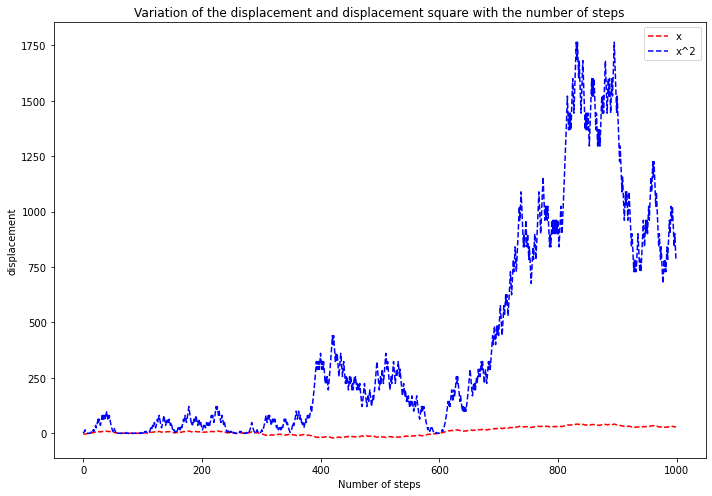

In [4]:
# plotting the x and x2 with respect to step number
# Reset the matplotlib backend to the default setting 
mpl.use('Agg') # helpful for static plots and visualization
%matplotlib inline

# plotting the figure
plt.figure(figsize=(10,7))
traj = random_walk_1D(1000, hops=1)
plt.plot(np.linspace(0,999,1000), traj, '--r', label="x")
plt.plot(np.linspace(0,999,1000), np.array([i**2 for i in traj]), '--b',label="x^2")
plt.title("Variation of the displacement and displacement square with the number of steps")
plt.xlabel("Number of steps")
plt.ylabel("displacement")
plt.tight_layout()
plt.legend()
plt.show()


*Answer : 02* <br/>
<br/>
*Part - I Averaging multiple simulations*

In [5]:
# averaging multiple simulations

# creating list to store the positions
final_pos =[]
for _ in range(100):
    position_with_time = random_walk_1D(1000, hops=1)

    # appending the last position of the random walk
    final_pos.append(position_with_time[-1])

# printing the final positiond of first 10 random walks
print(f"Final positions of first 10 Random Walks : {final_pos[:10]}")

Final positions of first 10 Random Walks : [24, -30, 26, -8, -18, 6, -6, -2, 2, -30]


*Part - II Computing mean square distplacement*

In [6]:
# computing the mean squared displacements of the random walks

def compute_MSD(final_pos):
    """
    Function that takes array of final positions and returns the MSD
    args:
        inputs: array of the final positions of n number of random walks
        outputs: mean squared displacement
    """
    # setting up variables
    squared_sum = 0

    # iterating over the final positions
    for i in final_pos:
        squared_sum += i**2

    mean_squared_disp = squared_sum/len(final_pos)

    return mean_squared_disp

# printing the mean squared displacement of 100 random walks 
print(f" The mean squared displacements of 100 1D random walks is : {compute_MSD(final_pos)}")

 The mean squared displacements of 100 1D random walks is : 869.2


*Part - III Checking the MSD tends to a linear function of number of steps with unity slope*

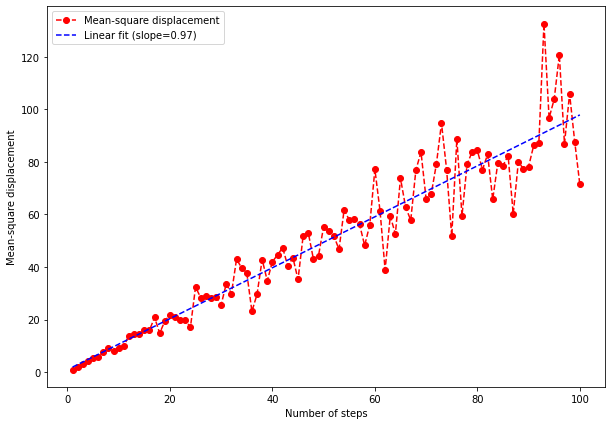

In [7]:
# we can calculate the mean square displacement (MSD) for different numbers of steps and plot it against the number of steps. 
# The slope of the line will give us the diffusion coefficient, which should be 1 if the MSD is proportional to the number of steps.

idx = np.linspace(0,99,100).astype(int).flatten()
MSD =[]
for i in idx:
    final_pos =[]
    for _ in range(100):
        position_with_time = random_walk_1D(100, hops=1)

        # appending the idx position of the random walk
        final_pos.append(position_with_time[i])

    MSD.append(compute_MSD(final_pos))


# Plot mean-square displacement as a function of number of steps
steps = np.arange(1, 100+1)
slope, intercept = np.polyfit(steps, MSD, 1)  # Fit a linear function to the data
plt.figure(figsize=(10,7))
plt.plot(steps, MSD, '--or', label='Mean-square displacement')
plt.plot(steps, slope*steps + intercept,'--b', label=f'Linear fit (slope={slope:.2f})')
plt.xlabel('Number of steps')
plt.ylabel('Mean-square displacement')
plt.legend()
plt.show()

*We can clearly see from the above image the slope is coming as 0.97 approx 1*

*Answer : 03* <br/>
<br/>
*Part - I Defining function of biased random walk*

In [8]:
def biased_random_walk_1D(bias, num_steps, hops=1):

    """
    This function generates ransdom walk in 1 D
    args:
        Inputs:
            bias : list for probablity say [0.25, 0.75]
            num_steps : int num_steps for which you want the random walk 
            hops : int (value of 1 hop in eg: 1 means it jumps 1 place)
        outputs: array of the positions of a partical with num_steps 
    """

    sequence_of_traj = []
    list_choice =["right", "left"]
    for _ in range(num_steps):
        temp_num = np.random.choice(list_choice, p=bias)
        if temp_num =="left":
            sequence_of_traj.append(-1*hops)
        else:
            sequence_of_traj.append(1*hops)

    # initilising an empty list to store the positions
    val = []
    x=0

    # iterating over the sequence of trajectories
    for i in sequence_of_traj:

        x+=i
        val.append(x)

    val = np.array(val)
    
    return val

*Part - II Affect the on shape of the average mean-square displacement with respect to the step number with bias of 0.7, 0.3 amoungst choices*

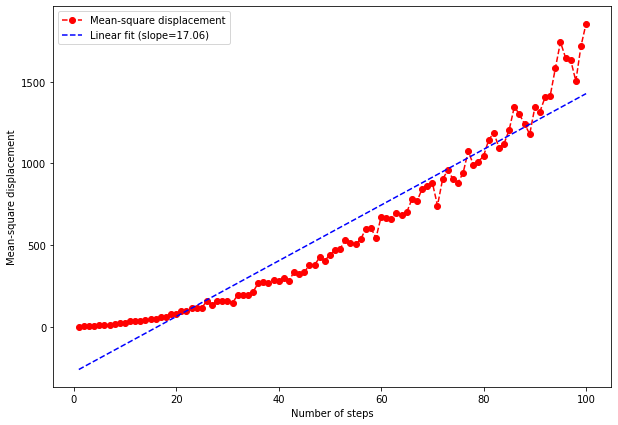

In [9]:
idx = np.linspace(0,99,100).astype(int).flatten()
MSD =[]
for i in idx:
    final_pos =[]
    for _ in range(100):
        position_with_time = biased_random_walk_1D([0.7,0.3], 100, hops=1)

        # appending the idx position of the random walk
        final_pos.append(position_with_time[i])

    MSD.append(compute_MSD(final_pos))


# Plot mean-square displacement as a function of number of steps
steps = np.arange(1, 100+1)
slope, intercept = np.polyfit(steps, MSD, 1)  # Fit a linear function to the data
plt.figure(figsize=(10,7))
plt.plot(steps, MSD, '--or', label='Mean-square displacement')
plt.plot(steps, slope*steps + intercept,'--b', label=f'Linear fit (slope={slope:.2f})')
plt.xlabel('Number of steps')
plt.ylabel('Mean-square displacement')
plt.legend()
plt.show()

*Answer : 04* <br/>
<br/>
*2D Random Walk with 1000 jumps*

In [10]:
# Necessary functionalities that will help in plotting and animination
%matplotlib notebook
plt.rcParams["animation.html"] = "jshtml"
mpl.rcParams['animation.embed_limit'] = 5 # Setting the limit of matplotlib animations to 5 mb
# Note the rendered output will not be of the entire duration because I have given less size per animination

In [11]:
# Answer 04
# Algorithm to run a 2D random walk with 1000 jumps

def random_walk_2D(time, hops=1):

    """
    This function generates ransdom walk in 2 D
    args:
        Inputs:
        time : int time for which you want the random walk 
        hops : int (value of 1 hop in eg: 1 means it jumps 1 place)
        outputs: array of the positions of a partical with time 
    """

    sequence_of_traj = []
    for _ in range(time):
        temp_num = np.random.rand()
        if temp_num < 0.25:
            sequence_of_traj.append(-1*hops) #left
        elif temp_num < 0.5:
            sequence_of_traj.append(2*hops) # up
        elif temp_num < 0.75:
            sequence_of_traj.append(-2*hops) # down
        else:
            sequence_of_traj.append(1*hops) #right

    # initilising an empty list to store the positions
    val_x, val_y = [], []
    x=0
    y=0
    # iterating over the sequence of trajectories
    for i in sequence_of_traj:
        if np.abs(i)==1:
            val_y.append(y)
            x+=i
            val_x.append(x)
        else:
            val_x.append(x)
            if i<0:
                i+=1
                y+=i
                val_y.append(y)
            else:
                i-=1
                y+=i
                val_y.append(y)

    val_x = np.array(val_x)
    val_y = np.array(val_y)
    
    return val_x, val_y


def plot(traj):
    """
    Function for plotting the random walk
    args:
        Inputs: traj (input trajectory of the random walk)
        outputs: 
    """

    fig, ax = plt.subplots(figsize=(7,5))
    xdata, ydata, xnewdata = [], [], []
    ln, = plt.plot([], [], '--or',label="Current position", animated=True)
    lb, = plt.plot([], [], '--ob', label="Previous position", animated=True)
    
    def init():
        ax.set_xlim(-100, 100)
        ax.set_ylim(-100, 100)
        return ln,lb,
    
    def animate(frame):
        x = frame
        xnew = traj[0][frame]
        y = traj[1][frame]
        
        xdata.append(x)
        xnewdata.append(xnew)
        ydata.append(y)
        ln.set_data(xnewdata[-1], ydata[-1])
        try:
            lb.set_data(xnewdata[-2], ydata[-2])
        except:
            pass
        return ln,lb,

    anim = animation.FuncAnimation(fig, animate, init_func=init, frames=len(traj[0]), interval=100, blit=True)
    
    plt.tight_layout()
    plt.plot(traj[0], traj[1], '--g', alpha=0.5, animated=False, label="Path of Random Walk")
    plt.title("Random Walk in 2D")
    plt.xlabel("Position of the pointer")
    plt.legend()
    plt.show()
    return anim


In [12]:
# Plotting the animation of the 2 D random walk
plot(random_walk_2D(1000, hops=1))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py", line 196, in process
    func(*args, **kwargs)
  File "/usr/local/lib/python3.8/dist-packages/matplotlib/animation.py", line 1467, in _stop
    self.event_source.remove_callback(self._loop_delay)
AttributeError: 'NoneType' object has no attribute 'remove_callback'


*Answer : 05*<br/>
<br/>
*Drunk Sailor Problem*

In [13]:
# 10 by 10 square grid with periodic conditions

def periodic_conditions(position):
    """
    This function takes input of the positions and ensures taht the boundary conditions are maintained
    Args:
        Inputs: list of positions
        Outputs: list of maintained positions
    """
    if position[0] > 9:
        position[0]=0
    elif position[0] < 0:
        position[0]=9
    
    if position[1] > 9:
        position[1]=0
    elif position[1] < 0:
        position[1]=9

    return position

def func_update(initial_position, rand_arg):
    """
    This function updates the positions of the sailor after reciveing the random argument
    Args:
        Inputs:
            initial_position: list of current positions (x, y)
            rand_arg: random argument that helps in updating the positions

        Outputs:
            new_pos: list of new positions after update (m,n)
    """
    if rand_arg == "up":
        initial_position[1]+=1
    elif rand_arg == "down":
        initial_position[1]-=1
    elif rand_arg =="right":
        initial_position[0]+=1
    elif rand_arg == "left":
        initial_position[0]-=1
    else:
        pass

    return initial_position


# defining collision walk
def collision_walk(sailor1, sailor2):
    """
    This function define the collision of the 2 drunk sailors
    Args:
        Inputs:
            sailor1: list of positions of sailor1
            sailor2: list of positions of sailor2
        Outputs: 
            n: number of steps after which the sailors bumb into each other
    """
    list_update = ["up", "down", "left", "right"]
    
    # let us say we do the random walk for 1000 time steps
    # Here we assume that the sailors collide before 1000 time steps
    for i in range(1000):
        # print(f"Iteration num : {i}")
        sailor1 = periodic_conditions(sailor1)
        sailor2 = periodic_conditions(sailor2)

        # random samples for the walk
        p1 = np.random.choice(list_update, p=[0.25,0.25,0.25, 0.25])
        # print(p1)
        p2 = np.random.choice(list_update, p=[0.25,0.25,0.25,0.25])
        # print(p2)
        sailor1 = func_update(sailor1, p1)
        # print(sailor1)
        sailor2 = func_update(sailor2, p2)
        # print(sailor2)

        if (sailor1[0] == sailor2[0]) and (sailor1[1]==sailor2[1]):
            # print(f"collision Happened at : {sailor2} and step number : {i}")
            return i
            break
        else:
            pass

        

In [14]:
# defining the positions of sailors
sailor1 = np.array([0,0])
sailor2 = np.array([5,5])

print(f"The collision of the sailors happend at step : {collision_walk(sailor1, sailor2)}")


The collision of the sailors happend at step : 73


*Part - II performing multiple simulations, determine the average number of steps after which the two sailors bump into each other*

In [15]:
coll_list = []

for i in range(1000):
    # defining the positions of sailors
    sailor1 = np.array([0,0])
    sailor2 = np.array([5,5])

    coll_list.append(collision_walk(sailor1, sailor2))
coll_list = np.array(coll_list)
print(f"Average number of steps after which the two sailors bump into each other is {np.round(coll_list.sum()/len(coll_list))}")

Average number of steps after which the two sailors bump into each other is 112.0


*Answer: 06* <br/>
<br/>
*Part - I Defining the Park-Miller Random Number Generator*

In [16]:
# Reset the matplotlib backend to the default setting 
mpl.use('Agg') # helpful for static plots and visualization
%matplotlib inline

In [17]:
# Answer 06
# Park–Miller random number generator

def random_num_gen(random_seed, a, m,  num, range_of_arr):
    """
    This function is the implementation of Park-Miller random number generator
                        L(i+1) = (a*Li)%m
    args:
        inputs: random_seed (Initial Seed value) int
                a (constant for generating number) int
                m (constant for generating number) int
                num (number of random numbers requeired) int
                range_of_arr (range_of_arr in which you want the random numbers to be generated) tuple of ints

        outputs: array of randomly generated numbers
    """
    # Defining a empty list
    list_of_nums = []

    # iterating over to produce the required numbers
    for i in range(num):
        temp = (a*random_seed)%m

        # storing the generated number as seed for next iter
        random_seed = temp

        # appending the genrated number to list
        list_of_nums.append(temp)
        
    # Normalizing the list to (0, 1) range_of_arr
    ans = np.array(list_of_nums)*(1/m)

    # Changing the range_of_arr of the numbers to the required range_of_arr (p,q)

    def range_transformer(array, range_of_arr):
        """
        This function transforms the range_of_arr of numbers to the dezired range_of_arr
        args:
            Inputs: array of numbers
                    range_of_arr (p, q) tuple of numbers 
            Outputs: array of transformed numbers
        """
        # Taking out the lower and upper limits from range_of_arr
        p, q = range_of_arr
        # initilizing an empty list to store the transformed values
        trans = []
        # iterating over the values
        for i in array:
            # transformeing and appending
            trans.append((p+(q-p)*i))

        return np.array(trans)

    ans = range_transformer(ans, range_of_arr)

    return np.round(ans)

In [18]:
#  generate a series of 200 random number with initial seed=71, a=18, m=167
numbers = random_num_gen(random_seed=71, a=18, m=167, num=200, range_of_arr=(1,10))

# printing the generated numbers
print(f"The first 10 generated random numbers are :\n{numbers[:10]}")

The first 10 generated random numbers are :
[ 7.  8.  5.  6.  3.  9.  4.  5. 10.  1.]


*Part -II Finding the sequence of the series*

In [19]:
# Finding the period to obtain the series

def find_period(num_list):
    """
    Function that takes the input as list of numbers and and returns the recourring series

    args:
        Inputs: num_list (list of numbers)
        Outputs: period of the list
    """
    # computing the leangth of the list
    n = len(num_list)

    # iterating over the list 
    for period in range(1, n):
        # comparing the lists by iterating over every suset of the list in increasing order
        if all(num_list[i] == num_list[i % period] for i in range(period, n)):
            return period


In [20]:
# Find the period of the random numbers generated
period = find_period(numbers)
sequence = numbers[:period]

# Printing the results
print(f"The period of the list of random numbers generated is : {period}\nThe sequence is : {sequence}")

The period of the list of random numbers generated is : 83
The sequence is : [ 7.  8.  5.  6.  3.  9.  4.  5. 10.  1.  6.  7.  6. 10.  9.  2.  2.  5.
  3. 10.  8.  2.  2.  8.  5. 10.  6.  3.  4.  6.  9. 10.  2.  5.  7.  3.
  8.  9.  3. 10.  3.  5.  6.  8.  6.  9.  5.  9.  2.  7.  2.  8. 10.  7.
  3.  3.  3.  7. 10.  4.  4.  5.  5.  4.  9.  7.  7.  9.  8.  7.  9.  5.
  5.  9.  7.  4.  7.  8.  9.  8.  3.  7.  5.]


In [21]:
# Numerical verification of the above results
print(f"First 10 values : {numbers[:10]}")
print(f"10 values after {period} index: {numbers[period:period+10]}")

First 10 values : [ 7.  8.  5.  6.  3.  9.  4.  5. 10.  1.]
10 values after 83 index: [ 7.  8.  5.  6.  3.  9.  4.  5. 10.  1.]


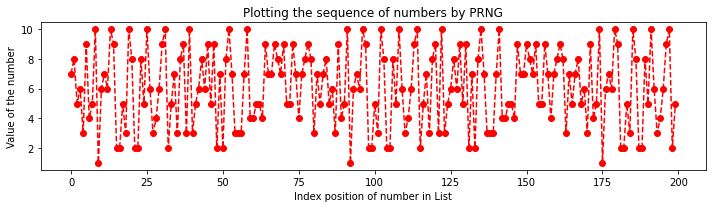

In [22]:
# Evidence that the numbers were repeating
# plotting the number sequence

plt.figure(figsize=(10,3))
plt.plot(numbers, "--or")
plt.title("Plotting the sequence of numbers by PRNG")
plt.ylabel("Value of the number")
plt.xlabel("Index position of number in List")
plt.tight_layout()
plt.show()

*From the plot above we can clearly see that numbers are being repeated and is around a value of 83*

In [23]:
# Finding the maximum value of a such that the leangth of the unique sequence is the maximum

def find_max_period(random_seed, m, num):
    """
    Function that returns the optimized value of a for the longest unique sequence

    Agrs:
        Inputs: seed value
                a (constant for generating number) int
                m (constant for generating number) int
                num (number of random numbers requeired) int
        Outputs: minimum value of a for max leangth of unique sequence
    """

    # setting a_range as the values from 1 to m
    a_range = range(1, m)

    # initilizing some values
    max_period = 0
    min_a_value = 0

    # Iterating over the range
    for a in a_range:
        # getting the sequence form the random number generator
        rng_sequence = random_num_gen(random_seed, a, m,  num, (1,10))

        # finding the period of the generated sequence
        period = find_period(rng_sequence)

        # Doing the comparision with the other
        if num/period > max_period:
            max_period = period
            min_a_value = a
        else:
            pass

    # Returning the minimum value of a for the max period
    return (min_a_value, num/max_period)

In [24]:
a_min, period = find_max_period(random_seed = 71, m = 167, num = 200)
print(f"The minimum value of a : {a_min}\nCoresponding period : {period}")

The minimum value of a : 166
Coresponding period : 100.0


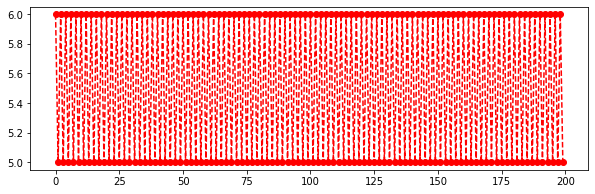

In [25]:
# Verification of the above
plt.figure(figsize=(10,3))
plt.plot(random_num_gen(random_seed=71, a=166, m=167,  num=200, range_of_arr=(1,10)), '--ro')